In [1]:
import sys
import os
from csbdeep.utils import Path, normalize
import numpy as np
import matplotlib.pyplot as plt
import glob
import numpy as np
from tifffile import imread, imwrite
from Utils.helpers import WingArea, multiplot, doubleplot
from skimage.morphology import remove_small_objects
from csbdeep.utils import Path, normalize
from csbdeep.models import Config, CARE
from skimage.filters import threshold_local, threshold_mean, threshold_otsu
from scipy.ndimage.morphology import binary_fill_holes
import pandas as pd
import difflib
from skimage import transform

Using TensorFlow backend.


**Hello, You only have to change one thing in this code which is the Masterdir, here you specify the path to the directory where your images are. After that you can do Cell Run all/ Kernel restart run all from the menu above to run the code**

In [2]:
Masterdir = '/media/sancere/Newton_Volume_1/DalmiroAnalysis/NewUnRotated/'
LeftName = 'L'
RightName = 'R'

MaskResults = Masterdir + '/MaskResults/'
AsymmetryResults = Masterdir + '/AsymmetryResults/'
AsymmetryResultsName = 'Asymmetry'
Model_Dir ='/home/sancere/Kepler/CurieDeepLearningModels/'

UNETSegmentationModelName = 'DeepWingSegmentationModelUNET'

UnetModel = CARE(config = None, name = UNETSegmentationModelName, basedir = Model_Dir)






Loading network weights from 'weights_best.h5'.








/home/sancere/anaconda3/lib/python3.7/site-packages/csbdeep/models/base_model.py:255: UserWarning: skipping normalization step after prediction because number of input and output channels differ.
  warnings.warn('skipping normalization step after prediction because ' +


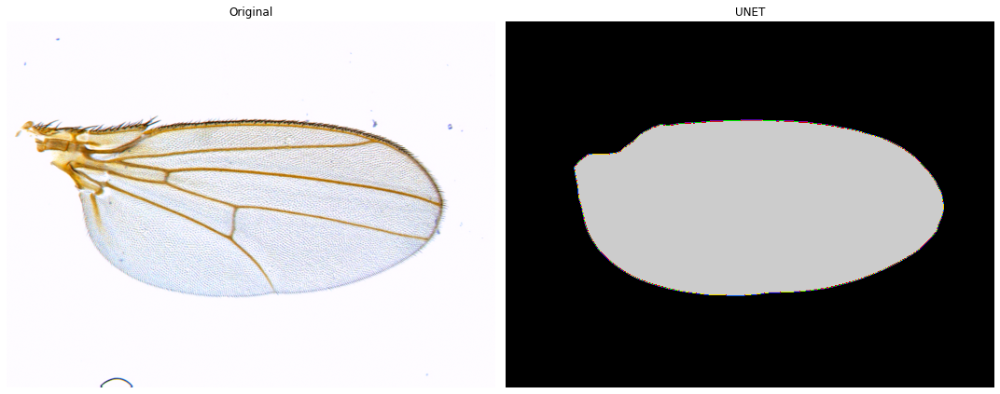

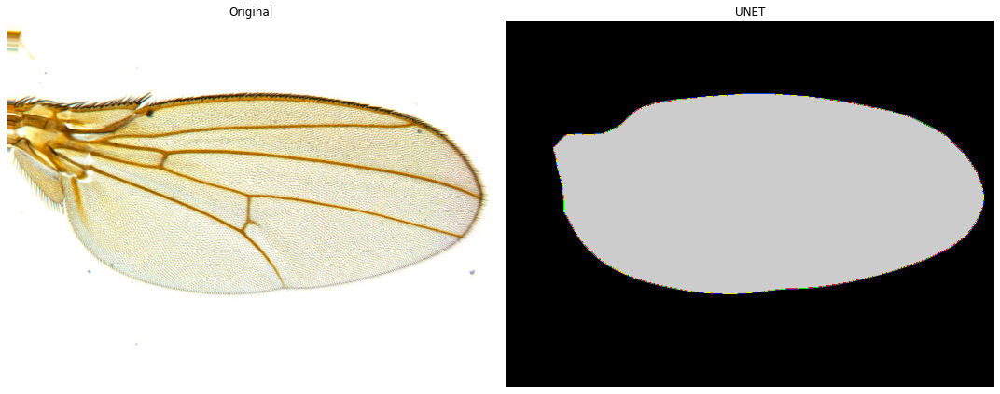

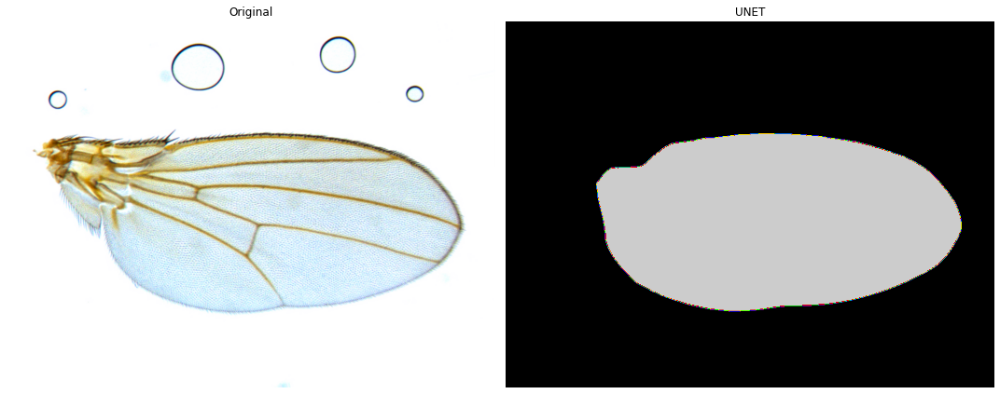

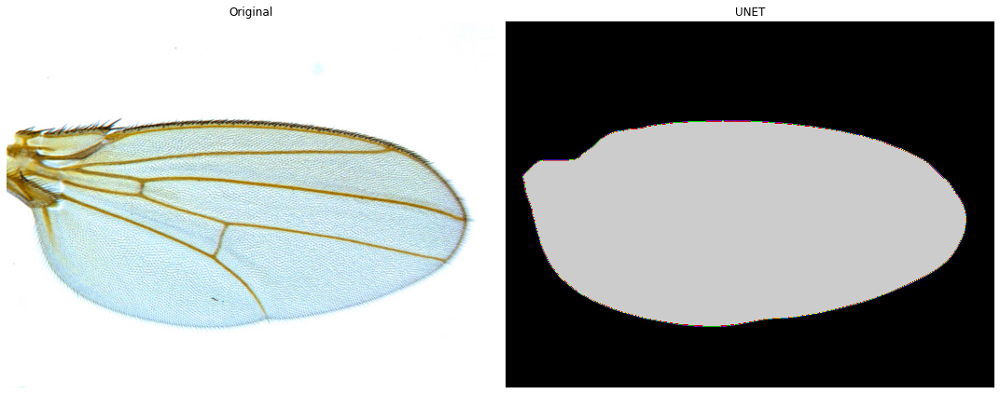

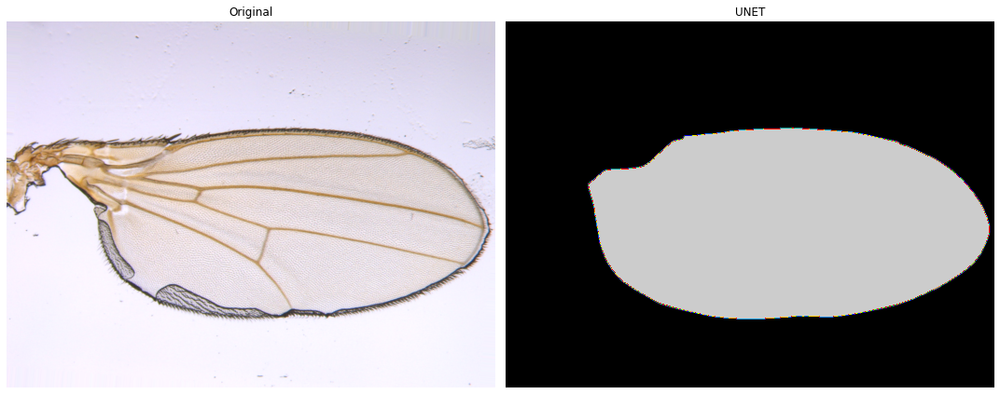

...

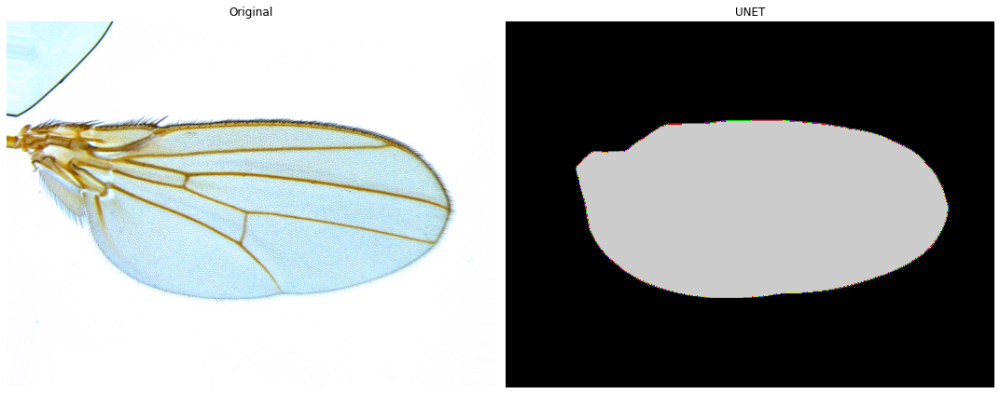

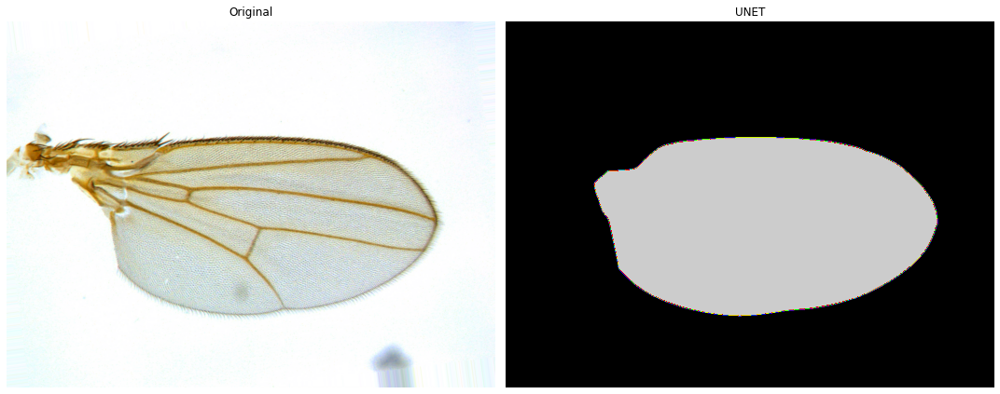

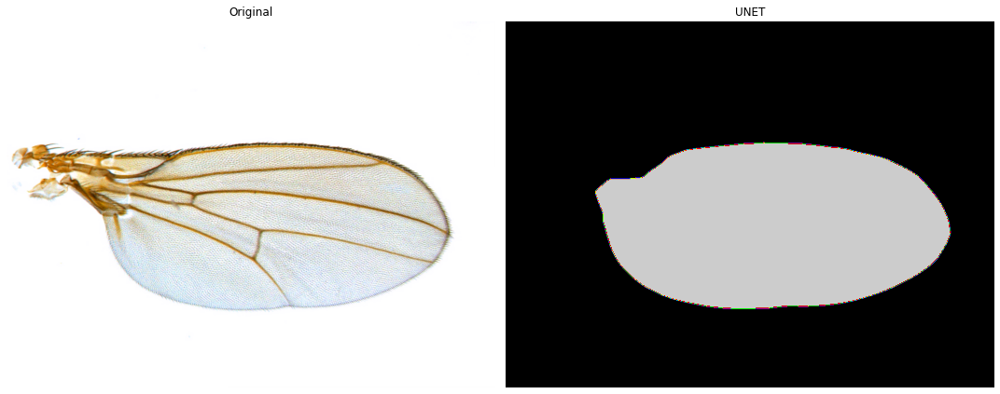

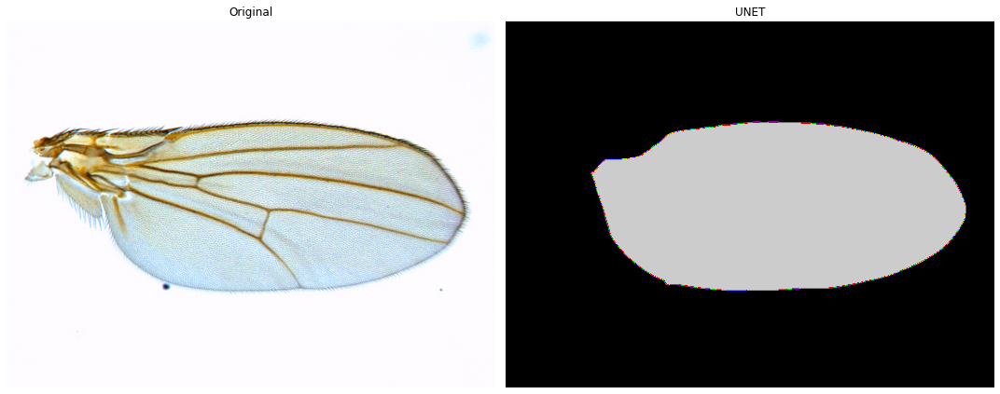

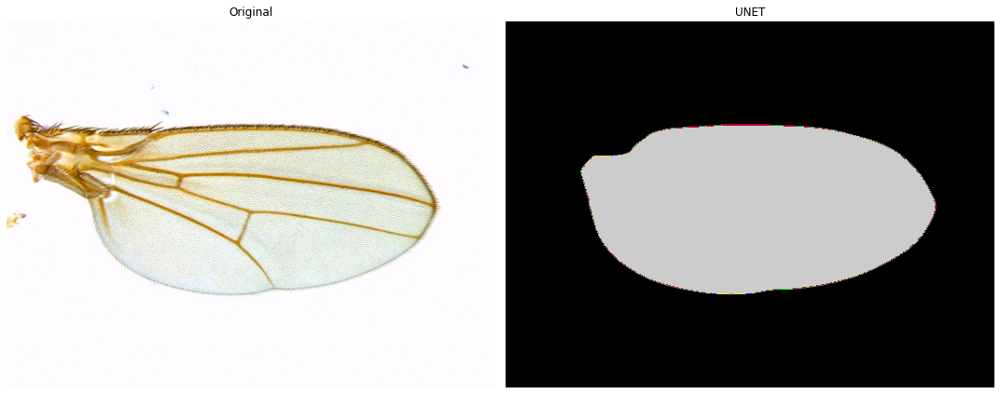

In [3]:
#Apply the prediction on wing directory
min_size = 15000
Raw_path = os.path.join(Masterdir, '*tif')
Path(MaskResults).mkdir(exist_ok = True)
Path(AsymmetryResults).mkdir(exist_ok = True)
axes = 'YXC'
saveaxes = 'YX'
filesRaw = glob.glob(Raw_path)
filesRaw.sort
count = 0
axis_norm = (0,1,2)   # normalize channels independently

for fname in filesRaw:
            
            #Read image        
            image = imread(fname)
            
            originalX = image.shape[0]
            originalY = image.shape[1]  
            
            Name = os.path.basename(os.path.splitext(fname)[0])
      
          
            if Name[-1] == 'L':
                image = transform.rotate(image,  180,  resize=False)
                image = np.flip(image, axis = 0)
            x = image[:,:,0:3]
            

            #Make sure image is 2D

            Segmented = UnetModel.predict(x,axes)
            thresh = threshold_otsu(Segmented) 
            Binary = Segmented > thresh
            Filled = binary_fill_holes(Binary)
            Finalimage = remove_small_objects(Filled, min_size)
     
            
            
            if count%100 == 0:
              doubleplot(image,Finalimage[:,:,0], 'Original', 'UNET', plotTitle = 'Segmentation Result' )
            count = count + 1 
            imwrite((MaskResults + 'Mask' + Name + '.tif' ) , Finalimage.astype('uint8'))


In [4]:
import pandas as pd
Path(AsymmetryResults).mkdir(exist_ok = True)
Raw_pathRight = os.path.join(MaskResults, '*tif')
Raw_pathLeft = os.path.join(MaskResults, '*tif')

filesRawRight = glob.glob(Raw_pathRight)
filesRawLeft = glob.glob(Raw_pathLeft)


AllRightArea = []
AllLeftArea = []
AllRightMinusLeftArea = []
AllRightPlusLeftArea = []
AllAssymetery = []
AllName = []
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 150)
for fnameRight in filesRawRight:
    
   NameRight = os.path.basename(os.path.splitext(fnameRight)[0]) 
   imageRight = imread(fnameRight)
   for fnameLeft in filesRawLeft:
       NameLeft = os.path.basename(os.path.splitext(fnameLeft)[0]) 
       imageLeft = imread(fnameLeft) 
       
       ChangeName = difflib.ndiff(NameLeft, NameRight)
       delta = ''.join(x[0:] for x in ChangeName if x.startswith('- '))
       
       #ChangeName = NameRight.replace(RightName, LeftName) 
       if delta == '- L':
           print(NameLeft, NameRight)
           RightArea, LeftArea, RightMinusLeft, RightPlusLeft, Assymetery = WingArea(imageLeft, imageRight)
         
           AllName.append(NameLeft)
           AllRightArea.append(RightArea)
           AllLeftArea.append(LeftArea)
           AllRightMinusLeftArea.append(RightMinusLeft)
           AllRightPlusLeftArea.append(RightPlusLeft)
           AllAssymetery.append(Assymetery)
            
df = pd.DataFrame(list(zip(AllRightArea,AllLeftArea,AllRightMinusLeftArea,AllRightPlusLeftArea,AllAssymetery)), index =AllName, 
                                              columns =['RightArea', 'LeftArea', 'Right-Left', 'Right+Left', 'Assymmetery'])

df.to_csv(AsymmetryResults + '/' + AsymmetryResultsName +  '.csv')  
df

Maskd8KOKO_1Xfood_controlled-density_25cte_16_L Maskd8KOKO_1Xfood_controlled-density_25cte_16_R
Maskpdm2_EcIRNAi_15_L Maskpdm2_EcIRNAi_15_R
MaskEip_w1118_cte29_OV-23.10_07_L MaskEip_w1118_cte29_OV-23.10_07_R
MaskEip_w1118_cte29_OV-of-09.10_11_L MaskEip_w1118_cte29_OV-of-09.10_11_R
MaskEipTS_EcRipan_TSwppD9_04_L MaskEipTS_EcRipan_TSwppD9_04_R
Maskd8KOKO_1Xfood_controlled-density_25cte_12_L Maskd8KOKO_1Xfood_controlled-density_25cte_12_R
Maskd8KO_old_parents_13L Maskd8KO_old_parents_13R
Maskact.ptth-i_00_L Maskact.ptth-i.KOKO_00_R
Maskact.ptth-i.KOKO_00_L Maskact.ptth-i.KOKO_00_R
Maskact.GFP_16_L Maskact.GFP.KOKO_16_R
Maskact.GFP.KOKO_16_L Maskact.GFP.KOKO_16_R
MaskEip_d8iTRIP_29d_17_L MaskEip_d8iTRIP_29d_17_R
Mask19B04.w1118_00_L Mask19B04.w1118_00_R
Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_20_L Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_20_R
MaskMHC_d8i-trip_29_fem_30L MaskMHC_d8i-trip_29_fem_30R
Maskact.ptth-i_07_L Maskact.ptth-i_07_R
Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_02

MaskPoor_F25d_dilp8iTRIP_w_09_L MaskPoor_F25d_dilp8iTRIP_w_09_R
Maskact.ptth-i_15_L Maskact.ptth-i_15_R
Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_08_L Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_08_R
Maskact.ptth-i_00_L Maskact.ptth-i_00_R
MaskHS_WPP_GFPv10_june20_11L MaskHS_WPP_GFPv10_june20_11R
Maskchronic29d_tubTS_d8iTRIP_F_02_L Maskchronic29d_tubTS_d8iTRIP_F_02_R
Masknub_EcRipan_KO_+_F_01_L Masknub_EcRipan_KO_+_F_01_R
Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_06_L Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_06_R
MaskEipTS_EcRipan_TSwppD9_08_L MaskEipTS_EcRipan_TSwppD9_08_R
MaskEip_w1118_cte29_OV-of-09.10_15_L MaskEip_w1118_cte29_OV-of-09.10_15_R
MaskEip_d8iGD_cte29_vir-of-6.10_OV-mix_09_L MaskEip_d8iGD_cte29_vir-of-6.10_OV-mix_09_R
Mask19.lgr3v22_new_09_L Mask19.lgr3v22_new_09_R
Maskpdm2_EcIRNAi_02_L Maskpdm2_EcIRNAi_02_R
Mask18chronic_tubTS_d8TRIP_06_L Mask18chronic_tubTS_d8TRIP_06_R
MaskMef2_w1118_29_fem_12L MaskMef2_w1118_29_fem_12R
Maskwpp_tubtsd8i_06L Maskwpp_tubtsd8i_06R


Mask19B04.w1118_21_L Mask19B04.w1118_21_R
Maskact.GFP.KO.plus_23_L Maskact.GFP.KO.plus_23_R
Maskact.GFP_23_L Maskact.GFP.KO.plus_23_R
MaskE22C_d8i-trip_oct2020_29ch_11L MaskE22C_d8i-trip_oct2020_29ch_11R
Maskact.ptth-i.KO.plus_02_L Maskact.ptth-i.KO.plus_02_R
Maskact.ptth-i_02_L Maskact.ptth-i.KO.plus_02_R
MaskPoor_F25d_E22C_dilp8iTRIP_22_L MaskPoor_F25d_E22C_dilp8iTRIP_22_R
Masknub_EcRipan_KO_+_F_03_L Masknub_EcRipan_KO_+_F_03_R
Maskwpp_tubtsgfp_23L Maskwpp_tubtsgfp_23R
MaskMHC_w1118_29_fem_02L MaskMHC_w1118_29_fem_02R
MasknubGFP_KO_KO__04_L Masknub_GFP_KO_KO_F_04_R
Masknub_EcRipan_KO_+_F_09_L Masknub_EcRipan_KO_+_F_09_R
Maskd8KO_young_parents_08L Maskd8KO_young_parents_08R
Maskd8KO_young_parents_10L Maskd8KO_young_parents_10R
Maskchronic29_F_EipTS_d8iTRIP_03_L Maskchronic29_F_EipTS_d8iTRIP_03_R
MaskPoor_F25d_Eip_dilp8iTRIP_01_L MaskPoor_F25d_Eip_dilp8iTRIP_01_R
MaskEip_w1118_cte29_OV-of-09.10_06_L MaskEip_w1118_cte29_OV-of-09.10_06_R
Mask29dchronic_EipTS_d8iTRIP_29_L Mask29dchronic_E

Mask18A01.w1118_new_12_L Mask18A01.w1118_new_12_R
Maskchronic29F_EipTS_EcRipan_07_L Maskchronic29F_EipTS_EcRipan_07_R
Mask19.w1118_new_18_L Mask19.w1118_new_18_R
Maskd8KOKO_1Xfood_controlled-density_25cte_29_L Maskd8KOKO_1Xfood_controlled-density_25cte_29_R
Maskwpp_tubtsgfp_26L Maskwpp_tubtsgfp_26R
Maskel3tubtsd8i_TSday6-7_04L Maskel3tubtsd8i_TSday6-7_04R
Mask18A01.w1118_08_L Mask18A01.w1118_08_R
Maskact.GFP_20_L Maskact.GFP.d8iGD_20_R
Maskact.GFP.d8iGD_20_L Maskact.GFP.d8iGD_20_R
MaskF25d_tubTS_d8iTRIP_TSday6_04_L MaskF25d_tubTS_d8iTRIP_TSday6_04_R
Maskact.ptth-i_10_L Maskact.ptth-i.d8iGD_10_R
Maskact.ptth-i.d8iGD_10_L Maskact.ptth-i.d8iGD_10_R
Maskact.ptth-i.d8iGD_28_L Maskact.ptth-i.d8iGD_28_R
Maskact.ptth-i_28_L Maskact.ptth-i.d8iGD_28_R
Masknub_GFP_25cte_09_L Masknub_GFP_25cte_09_R
MaskEip_d8iTrip_cte29_OV-of-09.10_28_L MaskEip_d8iTrip_cte29_OV-of-09.10_28_R
Mask19B04.w1118_38_L Mask19B04.w1118_38_R
Mask18A01.w1118_19_L Mask18A01.w1118_19_R
MaskPoor_M25d_Eip_dilp8iTRIP_04_L MaskPo

MasktubTS_GFPi-v10_29cte_22_L MasktubTS_GFPi-v10_29cte_22_R
MaskHS_WPP_d8iTRIP_june20_09L MaskHS_WPP_d8iTRIP_june20_09R
Maskwpp_tubtsgfp_01L Maskwpp_tubtsgfp_01R
Masknub.UAS-EcI_new_28_L Masknub.UAS-EcI_new_28_R
Maskact.ptth-i_04_L Maskact.ptth-i.KOKO_new_04_R
Maskact.ptth-i.KOKO_04_L Maskact.ptth-i.KOKO_new_04_R
Maskact.ptth-i.KOKO_new_04_L Maskact.ptth-i.KOKO_new_04_R
MaskHS_WPP_d8iTRIP_june20_03L MaskHS_WPP_d8iTRIP_june20_03R
MaskMef2_d8i-Trip_29_fem_04L MaskMef2_d8i-Trip_29_fem_04R
Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_24L Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_24_R
Maskact.GFP_12_L Maskact.GFP_12_R
Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_15_L Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_15_R
Maskact.ptth-i.KO.plus_07_L Maskact.ptth-i.KO.plus_07_R
Maskact.ptth-i_07_L Maskact.ptth-i.KO.plus_07_R
MaskPoor_F25d_Eip_dilp8iTRIP_39_L MaskPoor_F25d_Eip_dilp8iTRIP_39_R
Maske22c_w1118_cte29_OV-of-13.10_09L Maske22c_w1118_cte29_OV-of-13.10_09_R
Masknub_UASEcI_25cte_31_L Mas

Mask18A01.w1118_21_L Mask18A01.w1118_21_R
Mask29dchronic_EipTS_d8iTRIP_44_L Mask29dchronic_EipTS_d8iTRIP_44_R
Mask18A01.w1118_new_06_L Mask18A01.w1118_new_06_R
Mask18A01.w1118_06_L Mask18A01.w1118_new_06_R
MasktubTS_lgr3i-v22_29cte_19_L MasktubTS_lgr3i-v22_29cte_19_R
MaskE22C_d8iGD_cte29_vir-of-14.10_OV-mix-16.10-and-20.10_26_L MaskE22C_d8iGD_cte29_vir-of-14.10_OV-mix-16.10-and-20.10_26_R
Maskact.GFP_08_L Maskact.GFP_08_R
MaskTubTS_d8i_TRIP_F_29#U00b0C_05_L MaskTubTS_d8i_TRIP_F_29#U00b0C_05_R
Maskd8KOKO_1Xfood_controlled-density_25cte_33_L Maskd8KOKO_1Xfood_controlled-density_25cte_33_R
Maskwpp_tubtslgr3_06L Maskwpp_tubtslgr3_06R
Maskact.ptth-i_11_L Maskact.ptth-i_11_R
MasktubTS_GFPi-v10_29cte_01_L MasktubTS_GFPi-v10_29cte_01_R
Maskact.ptth-i_31_L Maskact.ptth-i.KO.plus_31_R
Maskact.ptth-i.KO.plus_31_L Maskact.ptth-i.KO.plus_31_R
MaskEip_w1118_cte29_OV-23.10_03_L MaskEip_w1118_cte29_OV-23.10_03_R
MasktubTS_WPP_d8iTRIP_june20_19L MasktubTS_WPP_d8iTRIP_june20_19R
Masknub.UAS-EcI_new_26_L

Maskpdm2_EcIRNAi_03_L Maskpdm2_EcIRNAi_03_R
Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_04L Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_04_R
MasktubTS_WPP_lgr3iv22_june20_07L MasktubTS_WPP_lgr3iv22_june20_07R
MaskMef2_d8i-Trip_29_fem_15L MaskMef2_d8i-Trip_29_fem_15R
MaskMHC_d8i-trip_29_fem_06L MaskMHC_d8i-trip_29_fem_06R
Maskact.GFP_38_L Maskact.GFP_38_R
MaskEip_w1118_cte29_OV-of-09.10_17_L MaskEip_w1118_cte29_OV-of-09.10_17_R
Maskchronic29_F_EipTS_d8iTRIP_20_L Maskchronic29_F_EipTS_d8iTRIP_20_R
MaskPoor_F25d_E22C_dilp8iTRIP_27_L MaskPoor_F25d_E22C_dilp8iTRIP_27_R
Mask19.w1118_new_02_L Mask19.w1118_new_02_R
Mask18A01.lgr3-i_v22_03L Mask18A01.lgr3-i_v22_03R
Maskwpp_tubtsgfp_12L Maskwpp_tubtsgfp_12R
MaskPoor_M25d_Eip_dilp8iTRIP_21_L MaskPoor_M25d_Eip_dilp8iTRIP_21_R
Masknub_EcRipan_KO_+_F_02_L Masknub_EcRipan_KO_+_F_02_R
Maskact.GFP_02_L Maskact.GFP.KO.plus_02_R
Maskact.GFP.KO.plus_02_L Maskact.GFP.KO.plus_02_R
MaskEip_w1118_cte29_OV-of-09.10_13_L MaskEip_w1118_cte29_OV-of-09.10_13_R

MaskE22C_d8i-trip_oct2020_29ch_06L MaskE22C_d8i-trip_oct2020_29ch_06R
Mask18chronic_tubTS_d8TRIP_00_L Mask18chronic_tubTS_d8TRIP_00_R
Maskact.ptth-i.KO.plus_09_L Maskact.ptth-i.KO.plus_09_R
Maskact.ptth-i_09_L Maskact.ptth-i.KO.plus_09_R
MaskPoor_F25d_Eip_dilp8iTRIP_03_L MaskPoor_F25d_Eip_dilp8iTRIP_03_R
Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_23L Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_23_R
MaskMHC_w1118_29_fem_25L MaskMHC_w1118_29_fem_25R
Maskact.ptth-i_30_L Maskact.ptth-i_30_R
MasktubTS_WPP_GFPv10_june20_10L MasktubTS_WPP_GFPv10_june20_10R
MaskMHC_d8i-trip_29_fem_09L MaskMHC_d8i-trip_29_fem_09R
Mask18A01.w1118_20_L Mask18A01.w1118_20_R
Maskpdm2_EcIRNAi_14_L Maskpdm2_EcIRNAi_14_R
Mask18chronic_tubTS_d8TRIP_16_L Mask18chronic_tubTS_d8TRIP_16_R
Mask19B04.lgr3-i_v22_36_L Mask19B04.lgr3-i_v22_36_R
MaskPoor_F25d_Eip_dilp8iTRIP_25_L MaskPoor_F25d_Eip_dilp8iTRIP_25_R
Mask18A01.lgr3-i_v22_03L Mask18A01.lgr3-i_v22_newset_03_R
Mask18A01.lgr3-i_v22_newset_03_L Mask18A01.lgr3-i_v22_n

Mask18A01.w1118_38_L Mask18A01.w1118_38_R
Maskact.ptth-i_19_L Maskact.ptth-i.d8iGD_19_R
Maskact.ptth-i.d8iGD_19_L Maskact.ptth-i.d8iGD_19_R
Maskact.ptth-i.KOKO_new_01_L Maskact.ptth-i.KOKO_new_01_R
Maskact.ptth-i_01_L Maskact.ptth-i.KOKO_new_01_R
Maskact.ptth-i.KOKO_01_L Maskact.ptth-i.KOKO_new_01_R
Mask18chronic_tubTS_d8TRIP_17_L Mask18chronic_tubTS_d8TRIP_17_R
Maskel3tubtsGFP_TSday6-7_20L Maskel3tubtsGFP_TSday6-7_20R
Maskact.ptth-i.d8iGD_09_L Maskact.ptth-i.d8iGD_09_R
Maskact.ptth-i_09_L Maskact.ptth-i.d8iGD_09_R
MaskHS_WPP_GFPv10_june20_03L MaskHS_WPP_GFPv10_june20_03R
Masknub.UAS-EcI_new_47_L Masknub.UAS-EcI_new_47_R
MaskEipTS_EcRipan_TSwppD9_13_L MaskEipTS_EcRipan_TSwppD9_13_R
Mask19B04.lgr3-i_v22_05_L Mask19B04.lgr3-i_v22_05_R
Maskact.GFP.KO.plus_18_L Maskact.GFP.KO.plus_18_R
Maskact.GFP_18_L Maskact.GFP.KO.plus_18_R
Maske22c_w1118_cte29_OV-of-13.10_20L Maske22c_w1118_cte29_OV-of-13.10_20_R
Maskdilp8KO_allom_04_L Maskdilp8KO_allom_04_R
Maskd8KOKO_1Xfood_controlled-density_25cte_0

MaskE22C_d8i-trip_oct2020_29ch_02L MaskE22C_d8i-trip_oct2020_29ch_02R
MaskHS_WPP_GFPv10_june20_28L MaskHS_WPP_GFPv10_june20_28R
Mask19B04.w1118_10_L Mask19B04.w1118_10_R
MaskTubTS_d8i_TRIP_F_29#U00b0C_12_L MaskTubTS_d8i_TRIP_F_29#U00b0C_12_R
Maskchronic29_F_EipTS_d8iTRIP_24_L Maskchronic29_F_EipTS_d8iTRIP_24_R
Masknub_UASEcI_25cte_02_L Masknub_UASEcI_25cte_02_R
Mask19B04.lgr3-i_v22_35_L Mask19B04.lgr3-i_v22_35_R
MaskHS_WPP_d8iTRIP_june20_21L MaskHS_WPP_d8iTRIP_june20_21R
MaskE22C_d8iGD_cte29_vir-of-14.10_OV-mix-16.10-and-20.10_16_L MaskE22C_d8iGD_cte29_vir-of-14.10_OV-mix-16.10-and-20.10_16_R
MaskAtubTS_GFP_F_29#U00b0C_17_L MaskAtubTS_GFP_F_29#U00b0C_17_R
Masknub.UAS-EcI_new_01_L Masknub.UAS-EcI_new_01_R
MasktubTS_WPP_d8iTRIP_june20_28L MasktubTS_WPP_d8iTRIP_june20_28R
Maskact.GFP.KO.plus_26_L Maskact.GFP.KO.plus_26_R
Maskact.GFP_26_L Maskact.GFP.KO.plus_26_R
MaskMef2_d8i-Trip_29_fem_08L MaskMef2_d8i-Trip_29_fem_08R
Maskact.ptth-i.KO.plus_12_L Maskact.ptth-i.KO.plus_12_R
Maskact.ptth-i

Maskwpp_tubtslgr3_11L Maskwpp_tubtslgr3_11R
Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_13L Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_13_R
MaskHS_WPP_d8iTRIP_june20_13L MaskHS_WPP_d8iTRIP_june20_13R
MasknubTS_EcI_9d@18_2d@29_21_L MasknubTS_EcI_9d@18_2d@29_21_R
MasknubTS_EcI_9d@18_2d@29_L MasknubTS_EcI_9d@18_2d@29_21_R
Masknub_GFP_25cte_16_L Masknub_GFP_25cte_16_R
Maskwpp_tubtsgfp_04L Maskwpp_tubtsgfp_04R
Maskd8KO_young_parents_03L Maskd8KO_young_parents_03R
MaskEip_d8iTrip_cte29_OV-of-09.10_29_L MaskEip_d8iTrip_cte29_OV-of-09.10_29_R
MaskAtubTS_GFP_F_29#U00b0C_05_L MaskAtubTS_GFP_F_29#U00b0C_05_R
Maskel3tubtsd8i_TSday6-7_28L Maskel3tubtsd8i_TSday6-7_28R
MaskPoor_F25d_Eip_dilp8iTRIP_38_L MaskPoor_F25d_Eip_dilp8iTRIP_38_R
MaskE22C_d8i-trip_oct2020_29ch_13L MaskE22C_d8i-trip_oct2020_29ch_13R
MaskE22C_d8i-trip_oct2020_29ch_18L MaskE22C_d8i-trip_oct2020_29ch_18R
MasktubTS_lgr3i-v22_29cte_13_L MasktubTS_lgr3i-v22_29cte_13_R
MaskEip_w1118_cte29_OV-of-09.10_05_L MaskEip_w1118_cte29_OV-of

Mask19.lgr3v22_new_10_L Mask19.lgr3v22_new_10_R
Maskact.ptth-i.d8iGD_15_L Maskact.ptth-i.d8iGD_15_R
Maskact.ptth-i_15_L Maskact.ptth-i.d8iGD_15_R
Mask19B04.w1118_30_L Mask19B04.w1118_30_R
Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_16_L Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_16_R
MaskPoor_M25d_Eip_dilp8iTRIP_13_L MaskPoor_M25d_Eip_dilp8iTRIP_13_R
MasknubTS_EcI_9d@18_2d@29_L MasknubTS_EcI_9d@18_2d@29_14_R
MasknubTS_EcI_9d@18_2d@29_14_L MasknubTS_EcI_9d@18_2d@29_14_R
MaskE22C_d8i-trip_oct2020_29ch_04L MaskE22C_d8i-trip_oct2020_29ch_04R
Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_10_L Maske22c_d8i-trip_cte29_old-virg_OV-of-9.10_10_R
Maske22c_w1118_cte29_OV-of-13.10_03L Maske22c_w1118_cte29_OV-of-13.10_03_R
Maskel3tubtsGFP_TSday6-7_16L Maskel3tubtsGFP_TSday6-7_16R
Maskd8KO_young_parents_17L Maskd8KO_young_parents_17R
MaskMef2_w1118_29_fem_21L MaskMef2_w1118_29_fem_21R
MaskEip_d8GD__04_L MaskEip_d8iGD_29d_04_R
MaskPoor_F25d_E22C_dilp8iTRIP_06_L MaskPoor_F25d_E22C_dilp8iTRIP_06_R
MaskEi

Maskact.ptth-i.d8iGD_21_L Maskact.ptth-i.d8iGD_21_R
Mask18chronic_tubTS_d8TRIP_14_L Mask18chronic_tubTS_d8TRIP_14_R
MasknubGFP_KO_KO__18_L Masknub_GFP_KO_KO_F_18_R
Mask18A01.lgr3-i_v22_15L Mask18A01.lgr3-i_v22_15R
MaskPoor_M25d_Eip_dilp8iTRIP_19_L MaskPoor_M25d_Eip_dilp8iTRIP_19_R
MaskMHC_w1118_29_fem_12L MaskMHC_w1118_29_fem_12R
Maskact.ptth-i.d8iGD_26_L Maskact.ptth-i.d8iGD_26_R
Maskact.ptth-i_26_L Maskact.ptth-i.d8iGD_26_R
MasktubTS_GFPi-v10_29cte_27_L MasktubTS_GFPi-v10_29cte_27_R
Mask29dchronic_EipTS_d8iTRIP_27_L Mask29dchronic_EipTS_d8iTRIP_27_R
MaskEip_d8iGD_cte29_vir-of-6.10_OV-mix_13_L MaskEip_d8iGD_cte29_vir-of-6.10_OV-mix_13_R
MaskEip_d8GD__03_L MaskEip_d8iGD_cte29_vir-of-6.10_OV-mix_13_R
MaskEip_d8GD__01_L MaskEip_d8iGD_cte29_vir-of-6.10_OV-mix_13_R
Maskd8KOKO_1Xfood_controlled-density_25cte_35_L Maskd8KOKO_1Xfood_controlled-density_25cte_35_R
Maskwpp_tubtsd8i_04L Maskwpp_tubtsd8i_04R
MaskAtubTS_GFP_F_29#U00b0C_26_L MaskAtubTS_GFP_F_29#U00b0C_26_R
Maskchronic29F_EipTS_EcRip

MasknubTS_EcI_9d@18_2d@29_L MasknubTS_EcI_9d@18_2d@29_10_R
Maske22c_EcRipan_cte29_virg-of-6.10_OV-of-12.10_18_L Maske22c_EcRipan_cte29_virg-of-6.10_OV-of-12.10_18_R
Mask19B04.w1118_19_L Mask19B04.w1118_19_R
Maskchronic29_F_EipTS_d8iTRIP_07_L Maskchronic29_F_EipTS_d8iTRIP_07_R
Maskact.ptth-i_16_L Maskact.ptth-i.KO.plus_16_R
Maskact.ptth-i.KO.plus_16_L Maskact.ptth-i.KO.plus_16_R
Mask18A01.lgr3-i_v22_00L Mask18A01.lgr3-i_v22_00R
MaskEip_d8iTrip_cte29_OV-of-09.10_24_L MaskEip_d8iTrip_cte29_OV-of-09.10_24_R
Maskd8KO_young_parents_13L Maskd8KO_young_parents_13R
MasktubTS_WPP_GFPv10_june20_09L MasktubTS_WPP_GFPv10_june20_09R
MasktubTS_WPP_d8iTRIP_june20_22L MasktubTS_WPP_d8iTRIP_june20_22R
Maskact.ptth-i_06_L Maskact.ptth-i_06_R
Masknub_EcRipan_KO_+_F_07_L Masknub_EcRipan_KO_+_F_07_R
Mask18chronic_tubTS_d8TRIP_11_L Mask18chronic_tubTS_d8TRIP_11_R
Maskdilp8KO_allom_29_L Maskdilp8KO_allom_29_R
Maske22c_w1118_cte29_OV-of-13.10_18L Maske22c_w1118_cte29_OV-of-13.10_18_R
MaskE22C_d8iGD_cte29_vir-o

Maskchronic29_F_EipTS_d8iTRIP_21_L Maskchronic29_F_EipTS_d8iTRIP_21_R
Maskchronic29F_EipTS_EcRipan_14_L Maskchronic29F_EipTS_EcRipan_14_R
Mask29dchronic_EipTS_d8iTRIP_38_L Mask29dchronic_EipTS_d8iTRIP_38_R
MasktubTS_GFPi-v10_29cte_20_L MasktubTS_GFPi-v10_29cte_20_R
Masknub_UASEcI_25cte_16_L Masknub_UASEcI_25cte_16_R
Maskel3tubtsd8i_TSday6-7_27L Maskel3tubtsd8i_TSday6-7_27R
Maskact.GFP_17_L Maskact.GFP_17_R
Mask19B04.w1118_12_L Mask19B04.w1118_12_R
Maskact.GFP_27_L Maskact.GFP.KO.plus_27_R
Maskact.GFP.KO.plus_27_L Maskact.GFP.KO.plus_27_R
Maskdilp8KO_allom_01_L Maskdilp8KO_allom_01_R
MaskPoor_F25d_Eip_dilp8iTRIP_14_L MaskPoor_F25d_Eip_dilp8iTRIP_14_R
MaskMHC_w1118_29_fem_22L MaskMHC_w1118_29_fem_22R
Mask19B04.w1118_20_L Mask19B04.w1118_20_R
Maskel3tubtsGFP_TSday6-7_18L Maskel3tubtsGFP_TSday6-7_18R
MaskMef2_d8i-Trip_29_fem_21L MaskMef2_d8i-Trip_29_fem_21R
Maskchronic29_F_EipTS_d8iTRIP_02_L Maskchronic29_F_EipTS_d8iTRIP_02_R
Maskact.GFP.KOKO_04_L Maskact.GFP.KOKO_04_R
Maskact.GFP_04_L Mas

Mask18A01.w1118_02_L Mask18A01.w1118_new_02_R
MaskEip_d8iGD_cte29_vir-of-6.10_OV-mix_05_L MaskEip_d8iGD_cte29_vir-of-6.10_OV-mix_05_R
Mask19.lgr3v22_new_11_L Mask19.lgr3v22_new_11_R
Mask19B04.lgr3-i_v22_19_L Mask19B04.lgr3-i_v22_19_R
Maske22c_EcRipan_cte29_virg-of-6.10_OV-of-12.10_23_L Maske22c_EcRipan_cte29_virg-of-6.10_OV-of-12.10_23_R
Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_18L Maske22c_d8iGD_cte29_vir-of-14.10_OV-of-16.10_18_R
Maskwpp_tubtslgr3_07L Maskwpp_tubtslgr3_07R
Maskchronic29F_EipTS_EcRipan_11_L Maskchronic29F_EipTS_EcRipan_11_R
MasktubTS_GFPi-v10_29cte_31_L MasktubTS_GFPi-v10_29cte_31_R
Maskel3tubtsGFP_TSday6-7_25L Maskel3tubtsGFP_TSday6-7_25R
Maskchronic29_F_EipTS_d8iTRIP_14_L Maskchronic29_F_EipTS_d8iTRIP_14_R
Maskact.GFP.KOKO_24_L Maskact.GFP.KOKO_24_R
Maskact.GFP_24_L Maskact.GFP.KOKO_24_R
Maske22c_w1118_cte29_OV-of-13.10_01L Maske22c_w1118_cte29_OV-of-13.10_01_R
MaskEip_d8iGD_cte29_lastone_00_L MaskEip_d8iGD_cte29_lastone_00_R
MaskEip_d8GD__00_L MaskEip_d8iGD_ct

Masknub_UASEcI_25cte_00_L Masknub_UASEcI_25cte_00_R
MasktubTS_WPP_d8iTRIP_june20_15L MasktubTS_WPP_d8iTRIP_june20_15R
Masknub.UAS-EcI_new_30_L Masknub.UAS-EcI_new_30_R
Masknub_GFP_25cte_10_L Masknub_GFP_25cte_10_R


,RightArea,LeftArea,Right-Left,Right+Left,Assymmetery
Maskd8KOKO_1Xfood_controlled-density_25cte_16_L,228563,212630,15933,441193,0.072227
Maskpdm2_EcIRNAi_15_L,255132,262906,-7774,518038,-0.030013
MaskEip_w1118_cte29_OV-23.10_07_L,206002,207428,-1426,413430,-0.006898
MaskEip_w1118_cte29_OV-of-09.10_11_L,225604,230813,-5209,456417,-0.022826
MaskEipTS_EcRipan_TSwppD9_04_L,236607,240252,-3645,476859,-0.015288
...,...,...,...,...,...
Masknub.UAS-EcI_new_17_L,242546,246012,-3466,488558,-0.014189
Masknub_UASEcI_25cte_00_L,241286,244912,-3626,486198,-0.014916
MasktubTS_WPP_d8iTRIP_june20_15L,273661,274108,-447,547769,-0.001632
Masknub.UAS-EcI_new_30_L,243576,244345,-769,487921,-0.003152


In [5]:
positivecount = np.sum(df['Assymmetery']>0)
negativecount = np.sum(df['Assymmetery']<0)   
print('Positive Count' , positivecount)
print('Negative Count' , negativecount)

Positive Count 799
Negative Count 1436


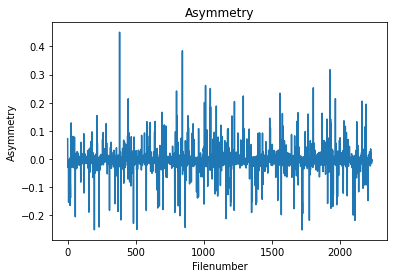

In [6]:
plt.plot(AllAssymetery)
plt.title("Asymmetry")
plt.ylabel("Asymmetry")
plt.xlabel("Filenumber")
plt.show()